# King County Property Sales-Client: Nicole Johnson

Client Name: Nicole Johnson
Role: Buyer

Requirements:

Neighborhood Preference: Nicole is looking for a neighborhood that is lively and centrally located within the city. She values the vibrancy and convenience of living in the heart of the city.

Price Range: Nicole is interested in properties that fall within the middle price range. She has a specific budget in mind and is seeking properties that align with her financial preferences.

Timing: Nicole is planning to make a purchase within the next year. It's crucial to find a property that meets her requirements within this timeframe.

Nicole's requirements are centered around finding a property in a lively and central neighborhood that fits her budget and aligns with her timeline for purchase. These criteria will guide the property search to ensure her needs and preferences are met.

Importing Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import psycopg2
import os
from dotenv import load_dotenv

Connecting Database

In [2]:
load_dotenv()

DATABASE = os.getenv('DATABASE')
USER_DB = os.getenv('USER_DB')
PASSWORD = os.getenv('PASSWORD')
HOST = os.getenv('HOST')
PORT = os.getenv('PORT')

In [3]:
# Create connection object conn
conn = psycopg2.connect(
    database=DATABASE,
    user=USER_DB,
    password=PASSWORD,
    host=HOST,
    port=PORT
)

In [4]:
cur = conn.cursor()

In [5]:
# import the data into a pandas dataframe
query_string = '''SET SCHEMA 'eda';

SELECT kchd.*, kchs."date", kchs.price  
FROM king_county_house_details kchd 
LEFT JOIN king_county_house_sales kchs 
ON kchd.id = kchs.house_id;'''

df = pd.read_sql(query_string, conn)

C:\Users\asus\AppData\Local\Temp\ipykernel_39316\3335067069.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query_string, conn)


In [6]:
df.describe()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19206.000000,21534.000000,21597.000000,21597.000000,21597.000000,21145.000000,21597.000000,17749.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,2.159700e+04
mean,4.580474e+09,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007602,0.233863,3.409825,7.657915,1788.596842,291.857224,1970.999676,836.650516,98077.951845,47.560093,-122.213983,1986.620318,12758.283512,5.402966e+05
std,2.876736e+09,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086858,0.765686,0.650546,1.173200,827.759761,442.490863,29.375234,4000.110554,53.513072,0.138552,0.140724,685.230472,27274.441950,3.673681e+05
min,1.000102e+06,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,7.800000e+04
25%,2.123049e+09,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,3.220000e+05
50%,3.904930e+09,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,4.500000e+05
75%,7.308900e+09,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,6.450000e+05
max,9.900000e+09,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,20150.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,7.700000e+06


Now that we have imported our data, let's try to understand which features (columns) the dataset is made up of, what their meaning is and what types of data they are.

'id': Dataframe index [int64]
'date': Date of the home sale [object]
'price': Price of the house [float64]
'bedrooms': Number of bedrooms [int64]
'bathrooms': Number of bathrooms [float64]
'sqft_living': Square feet of the structure [int64]
'sqft_lot': Square feet of the house [int64]
'floors': Number of floors [float64]
'waterfront': binary variable indicating whether house is sited by the waterfront [int64]
'view': Number of views of the house [int64]
'condition': Number of condition of the house [int64]
'grade': Number of grade of the house [int64]
'sqft_above' [int64]
'sqft_basement': Square feet of the basement [int64]
'yr_built': Year of construction [int64]
'yr_renovated': Year of renovation [int64]
'zipcode': Zipcode [int64]
'lat': Latitude coordinates [float64]
'long': Longitude coordinates [float64]
'sqft_living15': average living space of 15 neighbours[int64]
'sqft_lot15': average lot space of 15 neighbours[int64]

Now that we have had a first look at the data and know what it represents let's start working on the data to clean it before extracting the information.

Checking the following: 
- formatting problems in the column names?
- duplicates? 
- missing values? (what is the reason? and what can we do about it?)
- inconsistency in the meaning of data?
- different unit for data?
- different data types than expected?
- obvious outliers/ unexpected values?

Data Cleaning

In [7]:
# change "date" dtype to datetime with format %Y/%m/%d
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   bedrooms       21597 non-null  float64       
 2   bathrooms      21597 non-null  float64       
 3   sqft_living    21597 non-null  float64       
 4   sqft_lot       21597 non-null  float64       
 5   floors         21597 non-null  float64       
 6   waterfront     19206 non-null  float64       
 7   view           21534 non-null  float64       
 8   condition      21597 non-null  int64         
 9   grade          21597 non-null  int64         
 10  sqft_above     21597 non-null  float64       
 11  sqft_basement  21145 non-null  float64       
 12  yr_built       21597 non-null  int64         
 13  yr_renovated   17749 non-null  float64       
 14  zipcode        21597 non-null  int64         
 15  lat            2159

Jumping to the cleaning part

In [9]:
# import missingno
import missingno as msno

In [10]:
# display number of missing values per column
df.isna().sum()

id                  0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2391
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     452
yr_built            0
yr_renovated     3848
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
date                0
price               0
dtype: int64

In [11]:
# use fillna to impute missing values
df= df.fillna(0)

df.head(5)

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,date,price
0,7129300520,3.0,1.00,1180.0,5650.0,1.0,0.0,0.0,3,7,...,0.0,1955,0.0,98178,47.5112,-122.257,1340.0,5650.0,2014-10-13,221900.0
1,6414100192,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3,7,...,400.0,1951,19910.0,98125,47.7210,-122.319,1690.0,7639.0,2014-12-09,538000.0
2,5631500400,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3,6,...,0.0,1933,0.0,98028,47.7379,-122.233,2720.0,8062.0,2015-02-25,180000.0
3,2487200875,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5,7,...,910.0,1965,0.0,98136,47.5208,-122.393,1360.0,5000.0,2014-12-09,604000.0
4,1954400510,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3,8,...,0.0,1987,0.0,98074,47.6168,-122.045,1800.0,7503.0,2015-02-18,510000.0


<Axes: >

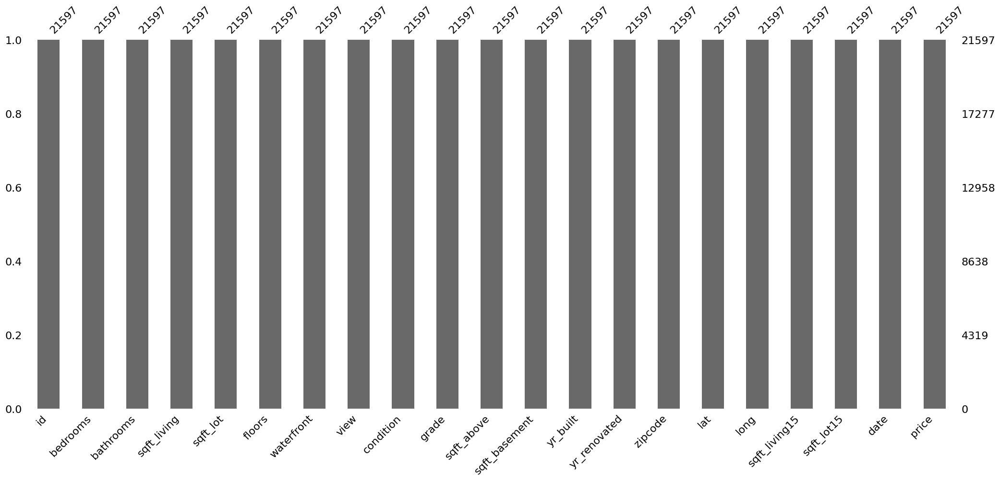

In [12]:
# plotting percentage of missing values per column
msno.bar(df)

In [13]:
# Duplicates have been checked, and it has been found that the only duplicates are the IDs, as one house may have been sold multiple times.
'''# on list of column names
duplicate = df[df.duplicated(['id'])]
 
print("Duplicate Rows based on Id :")
 
# Print the resultant Dataframe
duplicate

#import os  
#os.makedirs('optional', exist_ok=True)  
#duplicate.to_csv('optional/dupe.csv')  '''

'# on list of column names\nduplicate = df[df.duplicated([\'id\'])]\n \nprint("Duplicate Rows based on Id :")\n \n# Print the resultant Dataframe\nduplicate\n\n#import os  \n#os.makedirs(\'optional\', exist_ok=True)  \n#duplicate.to_csv(\'optional/dupe.csv\')  '

Visualisations

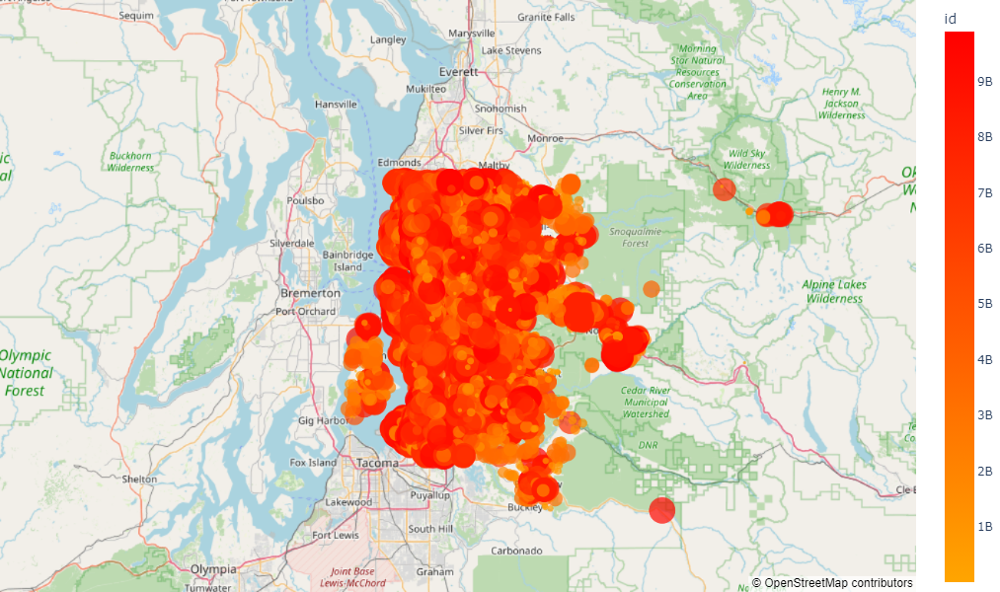

In [14]:
#Plotting the whole cleaned(df) data on Open street view map:

color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df, 
                        lat="lat", 
                        lon="long", 
                        hover_name="id", 
                        hover_data=["price"],
                        color="id",
                        color_continuous_scale=color_scale,
                        size="id",
                        zoom=8, 
                        height=600,
                        width=900)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Seattle Houses for Sale', title_x=0.5)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Checking the requirements of the Client:

1. Central location

In [15]:
# import the data into a pandas dataframe
# Using "Haversine formula" , filtering out the houses close to central location on the basis of central location cordinates:(47.560197, -122.213784)
# SQL query to find houses within a 5-mile radius of the coordinates (47.560197, -122.213784):
query_string = '''WITH eda_table AS (
    -- Subquerying for the join
    SELECT kchd.*, kchs."date", kchs.price  
    FROM king_county_house_details kchd 
    LEFT JOIN king_county_house_sales kchs 
    ON kchd.id = kchs.house_id
)

-- Applying the second query to the joined data
SELECT *
FROM eda_table
WHERE (
    6371 * 2 * ASIN(
        SQRT(
            SIN(RADIANS(lat - 47.560197) / 2) * SIN(RADIANS(lat - 47.560197) / 2) +
            COS(RADIANS(47.560197)) * COS(RADIANS(lat)) * SIN(RADIANS(long - (-122.213784)) / 2) * SIN(RADIANS(long - (-122.213784)) / 2)
        )
    )
) <= 5; -- 5 miles (you can adjust this radius)'''


df2 = pd.read_sql(query_string, conn)

C:\Users\asus\AppData\Local\Temp\ipykernel_39316\875478021.py:25: UserWarning:

pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.



df2 includes houses that are only close to the central location. Now looking into next criteria:

2. Price

In [16]:
#considering that client is ready to pay a mid range of the netire price range, lets take the mean of df:
df.price.mean()

540296.5735055795

In [17]:
df2.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,997.0,NaN,NaN,NaN,4340708756.529589,2523746731.887906,31000165.0,2425700022.0,3861400061.0,6072000380.0,9830200475.0
bedrooms,997.0,NaN,NaN,NaN,3.687061,0.925087,1.0,3.0,4.0,4.0,10.0
bathrooms,997.0,NaN,NaN,NaN,2.367603,0.840296,1.0,1.75,2.5,2.75,6.75
sqft_living,997.0,NaN,NaN,NaN,2553.74323,1089.299493,670.0,1800.0,2410.0,3140.0,9640.0
sqft_lot,997.0,NaN,NaN,NaN,11190.840522,8766.591756,779.0,7419.0,9719.0,12719.0,168000.0
floors,997.0,NaN,NaN,NaN,1.425777,0.507482,1.0,1.0,1.0,2.0,3.0
waterfront,883.0,NaN,NaN,NaN,0.02265,0.14887,0.0,0.0,0.0,0.0,1.0
view,992.0,NaN,NaN,NaN,0.513105,1.090196,0.0,0.0,0.0,0.0,4.0
condition,997.0,NaN,NaN,NaN,3.679037,0.738562,1.0,3.0,4.0,4.0,5.0
grade,997.0,NaN,NaN,NaN,8.258776,1.302313,5.0,7.0,8.0,9.0,12.0


From the above df2 describe, we can understand that the average prices in the central location is around 857919.
Still moving on to the medium price since client's requirement is the medium range of whole house price (whole dataset)

Also defining:
3. lively neighborhood as houses that are graded 10 or more with above than 3 Bedrooms.

In [18]:
# Define the middle price range. As '540296.57' as the average price, lets consider the middle price range as from 500000 to 600000.
lower_bound = 500000
upper_bound = 600000

# Filter houses within the middle price range
df2 = df[(df['price'] >= lower_bound) & (df['price'] <= upper_bound)]

# Define a broader grade range, here we define grade = 10 because we need a lively neighborhood
required_grade = df2['grade'] >= 10

#defning the lively neighborhood as apartments with more than 3 bedrooms

#more than 3 bedrooms
bedrooms = df2['bedrooms'] > 3

# Apply the condition to the DataFrame
df3 = df2[required_grade & bedrooms]

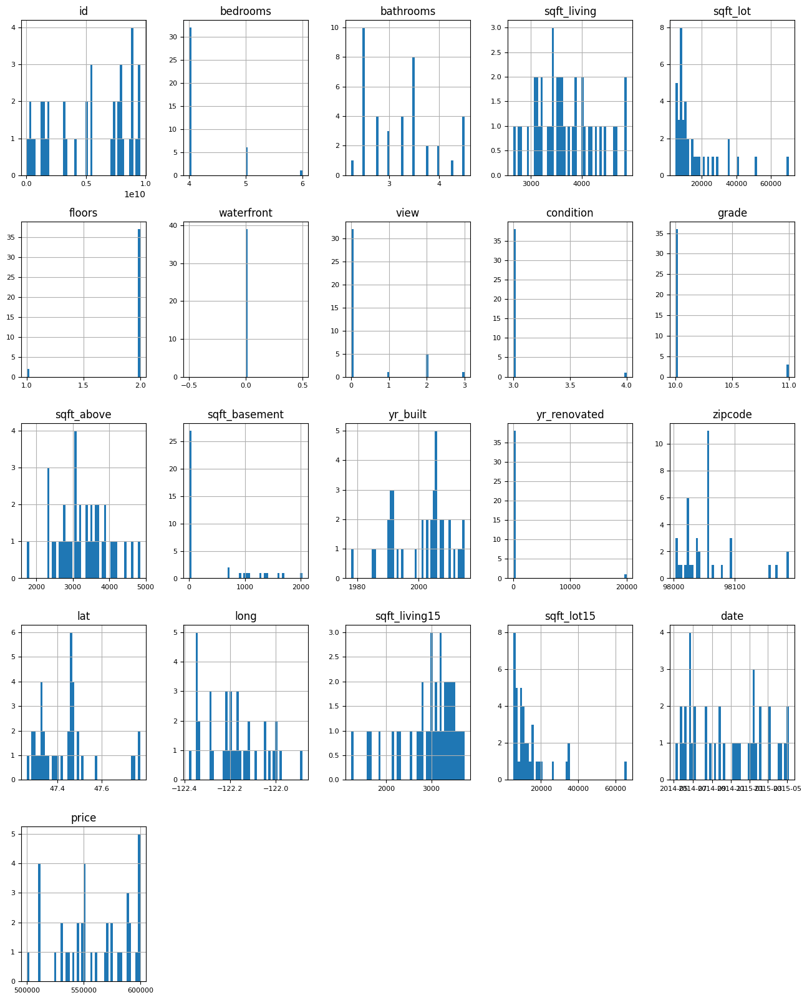

In [19]:
# to get a high level overview:
df3.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8); 

determine if the column 'condition' is negatively or positively correlated with price.


df3 includes houses that are in :
    1. 5 mile radius to the central location.
    2. Price range between 500000 and 600000.
    3. defined lively area where houses are graded as 10 or more with more than 3 bedrooms

Now lets look at the client's final requirement:
4. Client like to buy within a year.

Since its unclear the present day, we are assuming that today is May 2nd 2014.

In [20]:
# Set a reference date in 2014
reference_date = pd.to_datetime('2014-04-02')

# Calculate a time frame of one year (365 days) from the reference date
one_year_later = reference_date + pd.DateOffset(days=365)

# Create a copy of the DataFrame to avoid SettingWithCopyWarning
df3 = df3.copy()

# Convert the 'date' column to a datetime format using .loc
df3['date'] = df3['date'].apply(lambda x: pd.to_datetime(x))

# Filter properties listed within the one-year time frame
df4 = df3.loc[(df3['date'] >= reference_date) & (df3['date'] <= one_year_later)]

Data Visualisation on filtered data:

Visualising to check the distribution of price and date

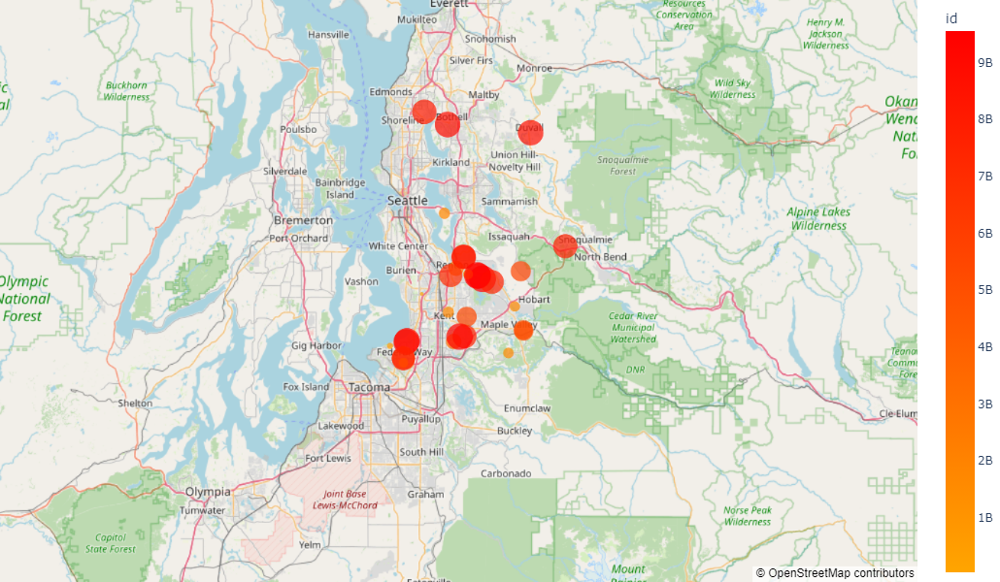

In [21]:
#Plotting the whole cleaned(df) data on Open street view map:

color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(df4, 
                        lat="lat", 
                        lon="long", 
                        hover_name="id", 
                        hover_data=["price"],
                        color="id",
                        color_continuous_scale=color_scale,
                        size="id",
                        zoom=8, 
                        height=600,
                        width=900)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Seattle Houses for Sale', title_x=0.5)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

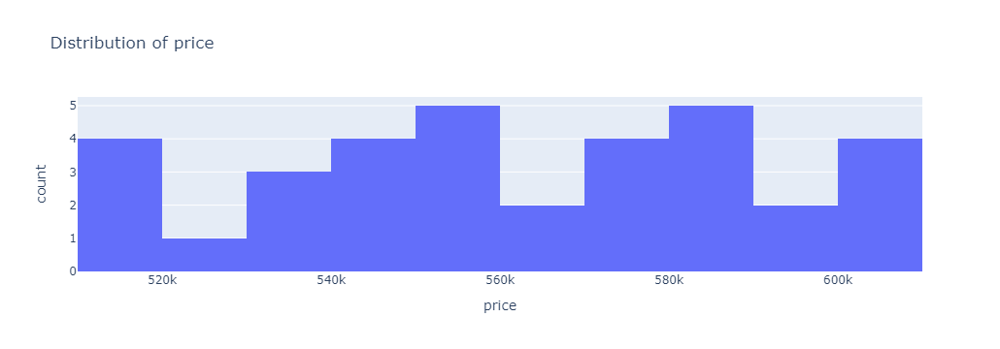

In [22]:
# to see the distribution of price in df4
fig = px.histogram(df4, 
                   x='price', 
                   nbins=10, 
                   title='Distribution of price')
fig.show()

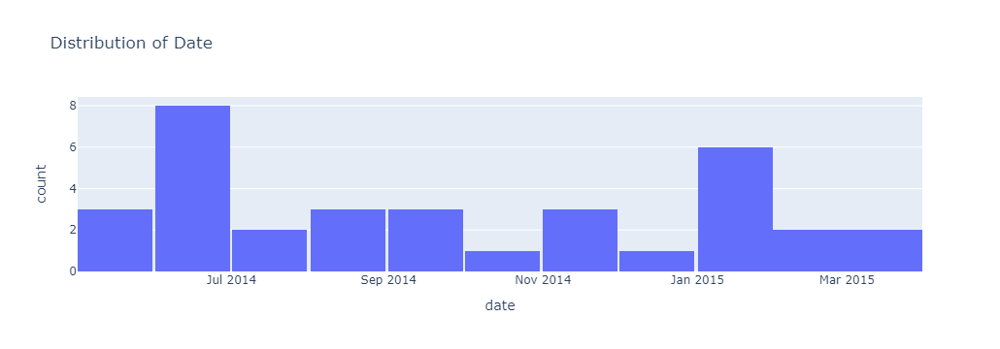

In [23]:
#to see the distribution of sale date in df4

fig = px.histogram(df4, 
                   x='date', 
                   nbins=10, 
                   title='Distribution of Date')
fig.show()

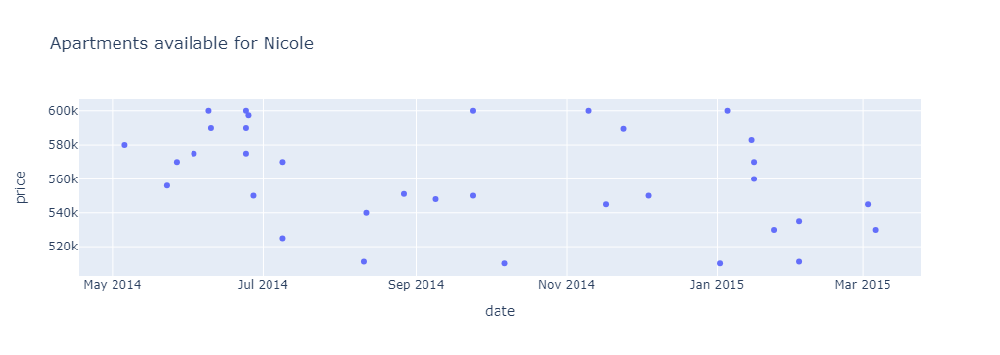

In [24]:
#to see the distribution of sale date in df4
#Options available for Nicole:
fig = px.scatter(df4, 
                   x='date', 
                   y= 'price', 
                   title='Apartments available for Nicole',
                   hover_data=['id', 'bedrooms'])
fig.show()

Based on the requirements and the provided data, Nicole Johnson can buy from the above plotted apartments, and the best time to buy is :

    1. Oct 7 2014
    2. Jan 2 2015
    3. Aug 11 2014
    4. Feb 3 2015

## 3 facts about the database: King County Property Sales

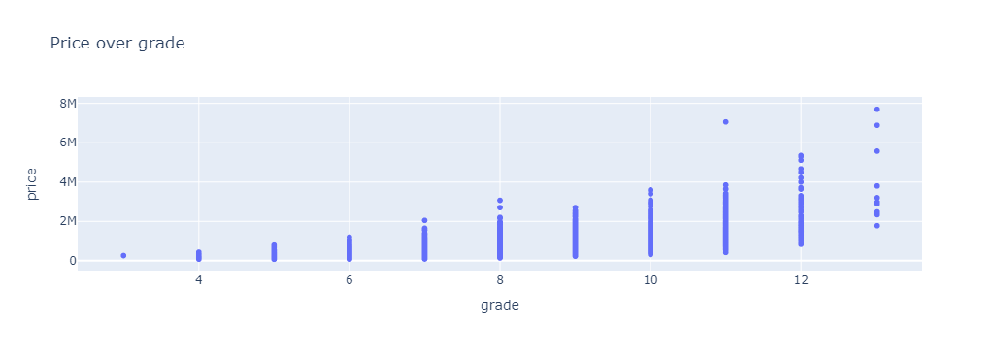

In [25]:
fig = px.scatter(df, 
                   x='grade', 
                   y= 'price', 
                   title='Price over grade',
                   hover_data=['id', 'bedrooms'])
fig.show()

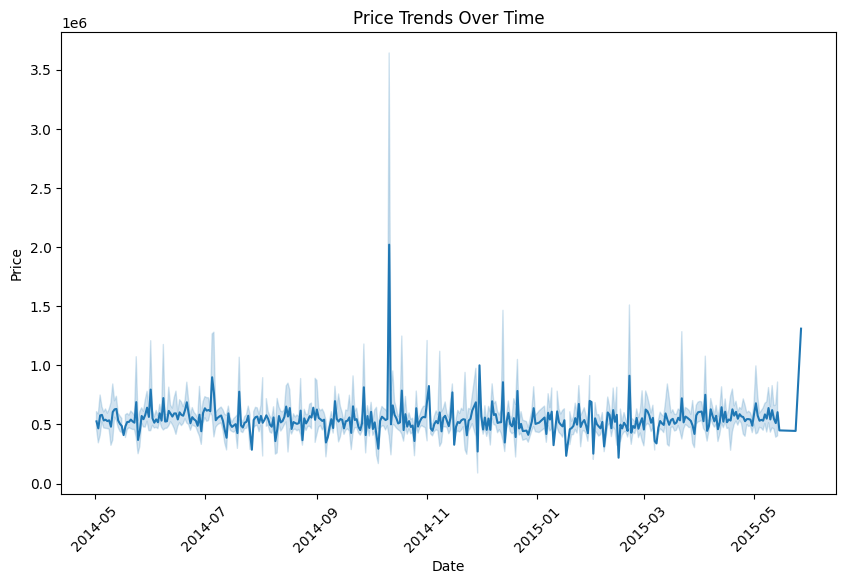

In [26]:
# Create the line plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.lineplot(x='date', y='price', data=df)

# You can customize the plot further with labels, titles, and other options
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Price Trends Over Time')
plt.xticks(rotation=45)  # Rotate the x-axis labels for readability

# Show the plot
plt.show()


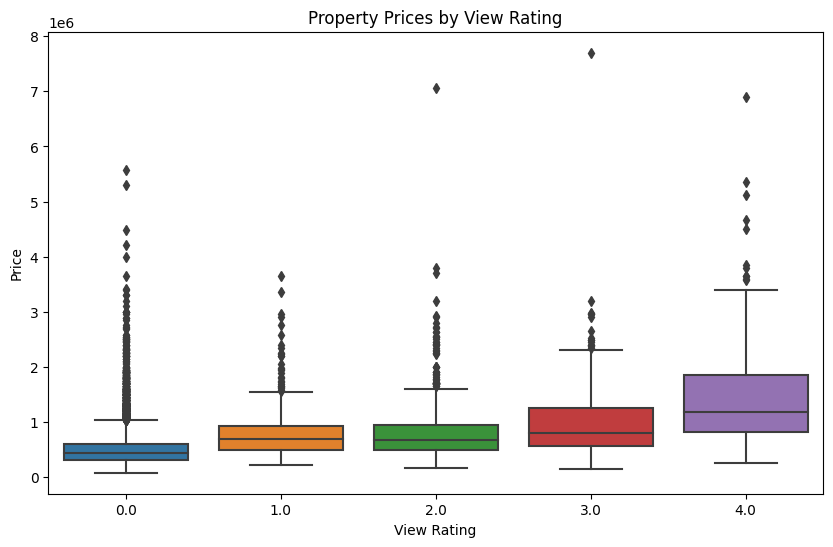

In [27]:
view_groups = df.groupby('view')

# Calculate mean and median property prices for each view rating
mean_prices = view_groups['price'].mean()
median_prices = view_groups['price'].median()

# Create a box plot to visualize the relationship
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='view', y='price')
plt.title('Property Prices by View Rating')
plt.xlabel('View Rating')
plt.ylabel('Price')
plt.show()